In [1]:
import torch
import torchvision
from torch import nn
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import trange, tqdm
from torch.utils.data import Dataset, DataLoader, random_split
import os
from PIL import Image
from torchvision import transforms
import pickle
# from torchmetrics import PSNR, SSIM
from torchmetrics import PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure
import torch.nn.functional as F
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import seaborn as sns

In [2]:
PSNR, SSIM = PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure

In [3]:
# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

Selected device: cuda


In [4]:
class AutoEncodeDataset(Dataset):
    """"""

    def __init__(self, dataset_gt, dataset_blur):
        self.dataset_gt = dataset_gt
        self.dataset_blur = dataset_blur

    def __len__(self):
        return len(self.dataset_gt)

    def __getitem__(self, idx):
        x, _ = self.dataset_blur.__getitem__(idx)
        y, _ = self.dataset_gt.__getitem__(idx)
        return x, y

In [5]:
initial_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.CenterCrop(112),
    transforms.Normalize(0.5,0.5)])

blur_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.CenterCrop(112),
    transforms.GaussianBlur(9,4),
    transforms.Normalize(0.5,0.5)])

In [6]:
data_dir = 'lfw_torch/'

train_dataset = AutoEncodeDataset(
    torchvision.datasets.LFWPeople(data_dir, split='train', download=True, transform=initial_transform),
    torchvision.datasets.LFWPeople(data_dir, split='train', download=True, transform=blur_transform)
)

test_dataset = AutoEncodeDataset(
    torchvision.datasets.LFWPeople(data_dir, split='test', download=True, transform=initial_transform),
    torchvision.datasets.LFWPeople(data_dir, split='test', download=True, transform=blur_transform)
)

Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified
Files already downloaded and verified


In [7]:
print(len(train_dataset))
print(len(test_dataset))
print(len(train_dataset) / 13233)

9525
3708
0.7197914305146226


In [8]:
batch_size = 8

N_val = int(len(train_dataset)*0.2)
train_dataset_red, val_dataset = random_split(train_dataset, 
                                 lengths=[len(train_dataset)-N_val, N_val], 
                                 generator=torch.Generator().manual_seed(42))
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0,)
train_dataloader_red = DataLoader(train_dataset_red, batch_size=batch_size, shuffle=True, num_workers=0)
val_dataloader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
test_dataloader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=0)

In [9]:
def plotrescale(data):
    return np.dstack(data)*0.5 + 0.5

In [10]:
class ConvAutoencoder(nn.Module):
    
    def __init__(self):
        super().__init__()
        
        ## Encoder
        # N, 3, 112, 112
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, 9), # N, 16, 104, 104
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 4, stride=2, padding=1), # N, 32, 51, 52
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, 4, stride=2, padding=1), # N, 32, 26
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 256, 4, stride=2), # N, 32, 12
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )
        
        ## Decoder
        # N, 64, 1, 1
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 256, 4, stride=2), # N, 32, 10, 10
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1), # N, 16, 28, 28
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1), # N, 16, 56, 56
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, 9),
            nn.Tanh()  
        )

    #     self.avg = nn.Sequential(
    #         nn.ConvTranspose2d(256, 256, 1),
    #         nn.BatchNorm2d(256),
    #         #nn.ReLU(),
    #     )

    #     self.log_var = nn.Sequential(
    #         nn.ConvTranspose2d(256, 256, 1),
    #         nn.BatchNorm2d(256),
    #         #nn.ReLU(),
    #     )
        
    # def sample_in_latent_space(self, mu, log_var): # sampling from MVN in latent space with provided mean and variances
    #     sigma = torch.exp(0.5 * log_var) #log_var is log(variance) = log(sigma**2) = 2 * log(sigma)
    #     return mu + torch.randn_like(mu) * sigma
    #     #Var(aX) = a**2 Var(X), so we need to multiply pred_sqrt_var = sigma (square root of the variance) by the standard normal distribution

    def forward(self, x):
        x = self.encoder(x)
        # avg = self.avg(x)
        # log_var = self.log_var(x)
        # x = self.sample_in_latent_space(avg, log_var)
        x = self.decoder(x)
        return x#, avg, log_var

In [11]:
class VConvAutoencoder(nn.Module):
    
    def __init__(self):
        super().__init__()
        
        ## Encoder
        # N, 3, 112, 112
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, 9), # N, 16, 104, 104
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 4, stride=2, padding=1), # N, 32, 51, 52
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, 4, stride=2, padding=1), # N, 32, 26
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 256, 4, stride=2), # N, 32, 12
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )
        
        ## Decoder
        # N, 64, 1, 1
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 256, 4, stride=2), # N, 32, 10, 10
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1), # N, 16, 28, 28
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1), # N, 16, 56, 56
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, 9),
            nn.Tanh()  
        )

        self.avg = nn.Sequential(
            nn.ConvTranspose2d(256, 256, 1),
            nn.BatchNorm2d(256),
            #nn.ReLU(),
        )

        self.log_var = nn.Sequential(
            nn.ConvTranspose2d(256, 256, 1),
            nn.BatchNorm2d(256),
            #nn.ReLU(),
        )
        
    def sample_in_latent_space(self, mu, log_var): # sampling from MVN in latent space with provided mean and variances
        sigma = torch.exp(0.5 * log_var) #log_var is log(variance) = log(sigma**2) = 2 * log(sigma)
        return mu + torch.randn_like(mu) * sigma
        #Var(aX) = a**2 Var(X), so we need to multiply pred_sqrt_var = sigma (square root of the variance) by the standard normal distribution

    def forward(self, x):
        x = self.encoder(x)
        avg = self.avg(x)
        log_var = self.log_var(x)
        x = self.sample_in_latent_space(avg, log_var)
        x = self.decoder(x)
        return x#, avg, log_var

In [12]:
# i file vcae e cae in questa cartella sono l'iter. n 15 e 30 rispettivamente del miglior vcae (l'ultimo di Luca rifatto su firefox) e del miglior cae (il primo di Luca rifatto ai tempi su chrome)
cae = ConvAutoencoder()
cae.load_state_dict(torch.load('./cae.pth')) # './cae_overfit/cae26.pth'

vcae = VConvAutoencoder()
vcae.load_state_dict(torch.load('./vcae.pth')) # './vcae_11.pth'

<All keys matched successfully>

In [11]:
t = torch.zeros([1, 3, 112, 112])
print(vcae.encoder(t).shape)
print(vcae.avg(vcae.encoder(t)).shape)

torch.Size([1, 256, 12, 12])
torch.Size([1, 256, 12, 12])


In [14]:
x = vcae.encoder(t)
y = nn.Conv2d(256, 256, 12)(x)
print(y.shape)

torch.Size([1, 256, 1, 1])

In [28]:
z = nn.ConvTranspose2d(256, 256, 12)(y)
print(z.shape)

torch.Size([1, 256, 12, 12])


In [29]:
print(vcae.decoder(y).shape)
print(vcae.decoder(z).shape)

torch.Size([1, 3, 24, 24])
torch.Size([1, 3, 112, 112])


In [13]:
base_path = './lfw_torch/lfw-py/lfw_funneled/'
actor_list = ['Angelina_Jolie', 'Bill_Gates', 'Jennifer_Aniston', 'Jennifer_Lopez', 'Meryl_Streep']
id = {actor:[] for actor in actor_list}
transform_comparison = torchvision.transforms.Compose([transforms.CenterCrop(112), transforms.Normalize(0.5, 0.5)])

for actor in actor_list:
    path = base_path + actor + '/'
    print(len(os.listdir(path)))

    # for i in range(1, len(os.listdir(path)) + 1):
    #     if i < 10:
    #         img = torchvision.io.read_image(path + f'{actor}_000{i}.jpg') # Image.open(path + f'{actor}_000{i}.jpg')
    #     else:
    #         img = torchvision.io.read_image(path + f'{actor}_00{i}.jpg') # Image.open((path + f'{actor}_00{i}.jpg'))

    #     #img = initial_transform(img) # richiede pil
    #     img = transform_comparison(img / 255)
    #     for idx, t in enumerate(train_dataset):
    #         if torch.equal(t[1], img):
    #             id[actor].append(f'train_{idx}')
    #             print(f'{actor=}, {i=}, {idx=}')
    #             break
    #     else:
    #         for idx, t in enumerate(test_dataset):
    #             if torch.equal(t[1], img):
    #                 id[actor].append(f'test_{idx}')
    #                 print(f'{actor=}, {i=}, {idx=}')
    #                 break

20
17
21
21
15


In [14]:
base_path = './funneled_selezionati/'
actor_list = ['Angelina_Jolie', 'Bill_Gates', 'Jennifer_Aniston', 'Jennifer_Lopez', 'Meryl_Streep'] + ['Leonardo_DiCaprio', 'Luciano_Pavarotti', 'Lucy_Liu']
lengths = []

for actor in actor_list:
    path = base_path + actor + '/'
    lengths.append(len(os.listdir(path)))

labels = np.repeat(actor_list, lengths) # https://stackoverflow.com/questions/12235552/r-function-rep-in-python-replicates-elements-of-a-list-vector
# print(labels)

In [15]:
inputs = torch.zeros([sum(lengths), 3, 112, 112])

i = 0

for actor in actor_list:
    for file in os.listdir(base_path + actor):
        inputs[i,...] = initial_transform(Image.open(base_path + actor + f'/{file}'))
        i += 1

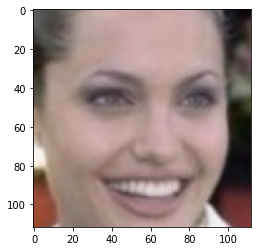

In [78]:
plt.imshow(inputs[0].numpy().transpose([1, 2, 0]) * 0.5 + 0.5)

In [16]:
inputs_blur = torch.zeros([sum(lengths), 3, 112, 112])

i = 0

for actor in actor_list:
    for file in os.listdir(base_path + actor):
        inputs_blur[i,...] = blur_transform(Image.open(base_path + actor + f'/{file}'))
        i += 1

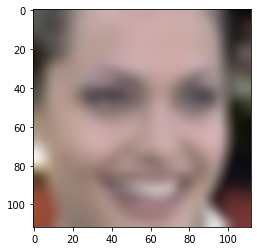

In [79]:
plt.imshow(inputs_blur[0].numpy().transpose([1, 2, 0]) * 0.5 + 0.5)

In [15]:
cae.eval()
encoded_inputs_cae = cae.encoder(inputs)

vcae.eval()
encoded_inputs_vcae = vcae.avg(vcae.encoder(inputs))

In [149]:
pca_cae = PCA(n_components = 2)
points_pca_cae = pca_cae.fit_transform(nn.Flatten(start_dim = 1)(encoded_inputs_cae.detach()))

In [150]:
pca_vcae = PCA(n_components = 2)
points_pca_vcae = pca_vcae.fit_transform(nn.Flatten(start_dim = 1)(encoded_inputs_vcae.detach()))

<AxesSubplot:>

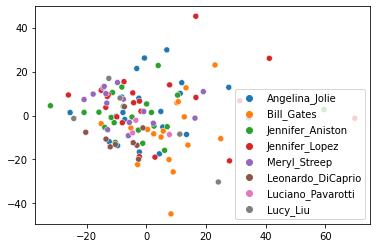

In [151]:
sns.scatterplot(x = points_pca_cae[:,0], y = points_pca_cae[:,1], hue = labels, legend = 'auto') #palette = colors_dict, ax = ax, 

In [152]:
# vcae.eval()
# encoded_inputs_vcae = (vcae.encoder(inputs))

<AxesSubplot:>

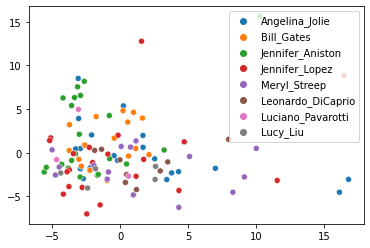

In [153]:
sns.scatterplot(x = points_pca_vcae[:,0], y = points_pca_vcae[:,1], hue = labels, legend = 'auto')

### tsne

<AxesSubplot:>

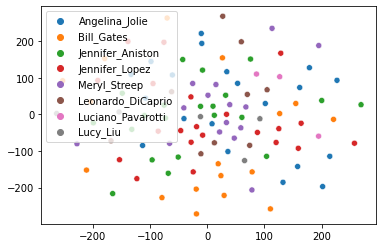

In [154]:
tsne_cae = TSNE(n_components = 2)
points_tsne_cae = tsne_cae.fit_transform(nn.Flatten(start_dim = 1)(encoded_inputs_cae.detach()))
sns.scatterplot(x = points_tsne_cae[:,0], y = points_tsne_cae[:,1], hue = labels, legend = 'auto')

<AxesSubplot:>

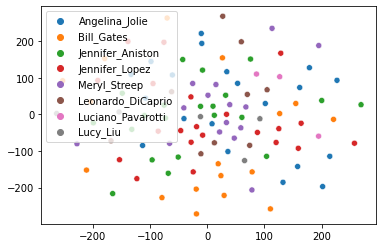

In [155]:
tsne_vcae = TSNE(n_components = 2)
points_tsne_vcae = tsne_vcae.fit_transform(nn.Flatten(start_dim = 1)(encoded_inputs_vcae.detach()))
sns.scatterplot(x = points_tsne_cae[:,0], y = points_tsne_cae[:,1], hue = labels, legend = 'auto')

forse è colpa del flatten, non sono sicuro di come navigare nello spazio latente visto che non è veramente di vettori ma di tensori

In [17]:
cae_pl = ConvAutoencoder()
cae_pl.load_state_dict(torch.load('./cae_pl.pth'))

<All keys matched successfully>

In [18]:
def metric_insight(psnr_vec, ssim_vec):
  print('AVG PSNR: '+str(psnr_vec.mean()))
  print('MAX PSNR: '+str(psnr_vec.max()))
  print('AVG SSIM: '+str(ssim_vec.mean()))
  print('MAX SSIM: '+str(ssim_vec.max()))

def mymetrics(model, device, dataset, verbose = True):
  psnr, ssim = PSNR().to(device), SSIM().to(device)
  psnr_values = np.zeros(len(dataset))
  ssim_values = np.zeros(len(dataset))
  model.to(device)
  model.eval()
  for ix, sample in tqdm(enumerate(dataset)):
    img = sample[0].unsqueeze(0).to(device)
    lab = sample[1].unsqueeze(0).to(device)
    with torch.no_grad():
        rec_img  = model(img)
    psnr_values[ix], ssim_values[ix] = psnr(rec_img, lab).cpu().numpy(), ssim(rec_img, lab).cpu().numpy()

  if verbose:
    # print('\n')
    metric_insight(psnr_values, ssim_values)
  return psnr_values, ssim_values

In [143]:
mymetrics(cae, device, test_dataset)
print('cae base')

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
3708it [01:24, 43.69it/s]

AVG PSNR: 30.62658053462945
MAX PSNR: 35.32696533203125
AVG SSIM: 0.8802438662211615
MAX SSIM: 0.9594606161117554
cae base


In [42]:
mymetrics(vcae, device, test_dataset)
print('vcae uscito buono su cv2 (firefox) in cima')
# print('vcae 1 con alpha = 1') # 13, 18, 0.12, 0.33

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
3708it [00:55, 66.73it/s]

AVG PSNR: 27.683332317212383
MAX PSNR: 32.755924224853516
AVG SSIM: 0.8159126064538184
MAX SSIM: 0.9119793176651001
vcae uscito buono su cv2 (firefox) in cima


In [106]:
mymetrics(cae_pl, device, test_dataset)
print('cae + pl')

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
3708it [00:55, 67.18it/s]



AVG PSNR: 24.283280942560914
MAX PSNR: 31.417388916015625
AVG SSIM: 0.7889024246214792
MAX SSIM: 0.8904518485069275


(array([22.61496162, 22.03160095, 25.14767265, ..., 25.89034081,
        22.35153389, 24.87784004]),
 array([0.78695267, 0.78440356, 0.83340663, ..., 0.82166624, 0.79966146,
        0.75738305]))

In [11]:
cae_pl_normaliz_vgg = ConvAutoencoder()
cae_pl_normaliz_vgg.load_state_dict(torch.load('./cae_pl_normaliz_vgg.pth'))

<All keys matched successfully>

In [12]:
mymetrics(cae_pl_normaliz_vgg, device, test_dataset)
print('cae + pl + normaliz vgg')

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
3708it [01:05, 56.87it/s]

AVG PSNR: 23.484886661702376
MAX PSNR: 28.191360473632812
AVG SSIM: 0.6660997530580082
MAX SSIM: 0.7946915626525879
cae + pl + normaliz vgg


In [13]:
cae_v0 = ConvAutoencoder()
cae_v0.load_state_dict(torch.load('./cae_v0.pth'))

<All keys matched successfully>

In [14]:
mymetrics(cae_v0, 'cpu', test_dataset)
print('cae v0')

3708it [04:35, 13.46it/s]

AVG PSNR: 10.472834700391003
MAX PSNR: 14.394285202026367
AVG SSIM: -0.004978261385140394
MAX SSIM: 0.5268115401268005
cae v0


In [19]:
cae_mpl_05 = ConvAutoencoder()
cae_mpl_05.load_state_dict(torch.load('./cae_mpl_05.pth'))

<All keys matched successfully>

In [25]:
mymetrics(cae_mpl_05, device, test_dataset)
print('cae mpl 0.5')

3708it [01:00, 61.35it/s]

AVG PSNR: 26.590743042247325
MAX PSNR: 33.54688262939453
AVG SSIM: 0.8391162276332303
MAX SSIM: 0.9414697885513306
cae mpl 0.5


In [20]:
cae_mpl_1 = ConvAutoencoder()
cae_mpl_1.load_state_dict(torch.load('./cae_mpl_1.pth'))

<All keys matched successfully>

In [32]:
mymetrics(cae_mpl_1, device, test_dataset)
print('cae mpl 1')

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
3708it [00:57, 64.57it/s]

AVG PSNR: 27.265094757594465
MAX PSNR: 33.520626068115234
AVG SSIM: 0.860094387795547
MAX SSIM: 0.9501432776451111
cae mpl 1


## grafici

In [20]:
# ho già fatto initial transform -> sono già tensori e devo prima invertire il normalize pre-blur
blur_transform_tensor = transforms.Compose([
    transforms.Normalize(-0.5, 2),
    transforms.GaussianBlur(9, 4),
    transforms.Normalize(0.5, 0.5)])

In [85]:
# inputs_blur.to('cuda')
# print()

In [21]:
cae_mpl_1.eval()
# y = cae_mpl_1(blur_transform_tensor(inputs))
# output_cae_mpl_1 = cae_mpl_1(blur_transform_tensor(inputs))
output_cae_mpl_1 = cae_mpl_1(inputs_blur)

In [22]:
def plot_img(x):
    plt.imshow(x.detach().numpy().transpose([1, 2, 0]) * 0.5 + 0.5)

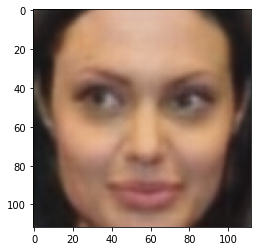

In [88]:
plot_img(output_cae_mpl_1[1])

In [23]:
cae.eval()
# output_cae = cae(blur_transform_tensor(inputs))
output_cae = cae(inputs_blur)

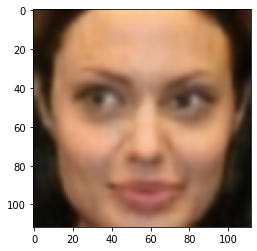

In [90]:
plot_img(output_cae[1])

In [45]:
vcae.to('cpu')
print()

In [24]:
cae_pl.eval()
# output_cae_pl = cae_pl(blur_transform_tensor(inputs))
output_cae_pl = cae_pl(inputs_blur)

cae_mpl_05.eval()
# output_cae_mpl_05 = cae_mpl_05(blur_transform_tensor(inputs))
output_cae_mpl_05 = cae_mpl_05(inputs_blur)

vcae.eval()
# output_vcae = vcae(blur_transform_tensor(inputs))
output_vcae = vcae(inputs_blur)

In [25]:
def pre_plot_img(x):
    return x.detach().numpy().transpose([1, 2, 0]) * 0.5 + 0.5

In [26]:
print(actor_list)
print(lengths)
print(list(np.cumsum(lengths)))

['Angelina_Jolie', 'Bill_Gates', 'Jennifer_Aniston', 'Jennifer_Lopez', 'Meryl_Streep', 'Leonardo_DiCaprio', 'Luciano_Pavarotti', 'Lucy_Liu']
[20, 17, 21, 21, 15, 9, 3, 5]
[20, 37, 58, 79, 94, 103, 106, 111]


In [26]:
class RESConvAutoencoder(nn.Module):
    
    def __init__(self):
        super().__init__()
        
        ## Encoder
        # N, 3, 112, 112
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, 9), # N, 16, 104, 104
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 4, stride=2, padding=1), # N, 32, 51, 52
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, 4, stride=2, padding=1), # N, 32, 26
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 256, 4, stride=2), # N, 32, 12
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )

        self.resblock1 = nn.Sequential(
            nn.Conv2d(256, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
        )

        self.resblock2 = nn.Sequential(
            nn.Conv2d(256, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
        )

        self.resblock3 = nn.Sequential(
            nn.Conv2d(256, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
        )
        
        ## Decoder
        # N, 64, 1, 1
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 256, 4, stride=2), # N, 32, 10, 10
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1), # N, 16, 28, 28
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1), # N, 16, 56, 56
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, 9),
            nn.Tanh()  
        )
        
    def forward(self, x):
        x = self.encoder(x)
        x = x + self.resblock1(x)
        x = x + self.resblock2(x)
        x = x + self.resblock3(x)
        x = self.decoder(x)
        return x

In [27]:
rescae = RESConvAutoencoder()
rescae.load_state_dict(torch.load('rescae.pth'))

<All keys matched successfully>

In [28]:
rescae.eval()
output_rescae = rescae(inputs_blur)

In [30]:
mymetrics(rescae, device, test_dataset)
print('rescae')

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
3708it [02:18, 26.68it/s]

AVG PSNR: 28.323641565110947
MAX PSNR: 33.14078903198242
AVG SSIM: 0.8324108938440408
MAX SSIM: 0.9380742311477661
rescae


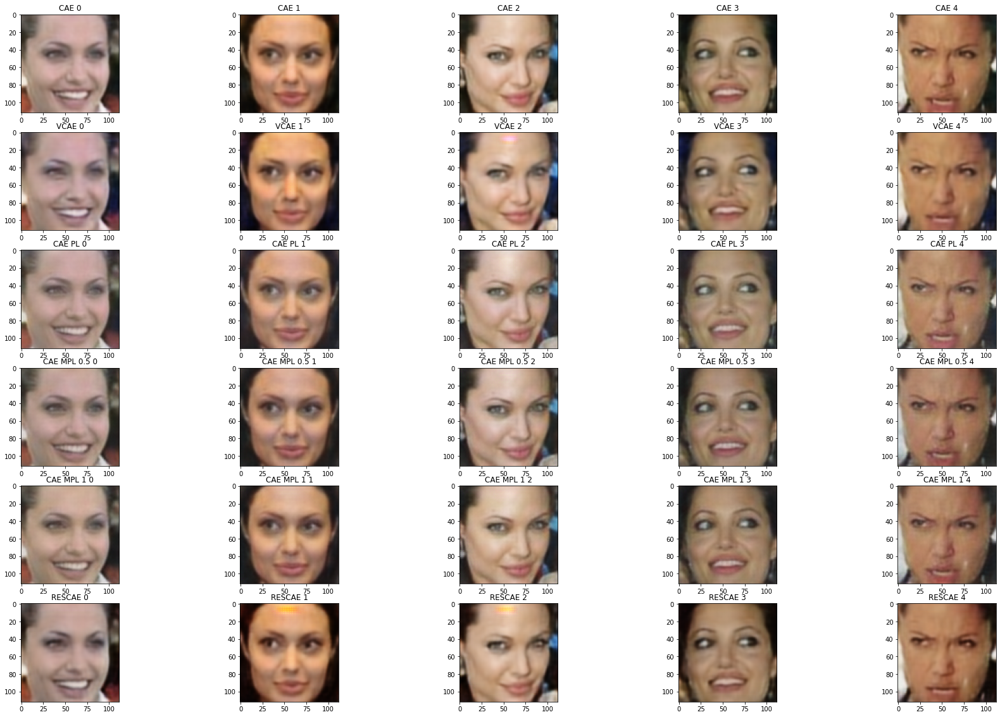

In [96]:
fig, ax = plt.subplots(nrows = 6, ncols = 5, figsize = (30, 20))
# subfig = fig.subfigures(nrows = 1, ncols = 5)
# subfig[0].suptitle('cae')
# subfig[1].suptitle('cae_mpl_1')

idx = 0

for i in range(5):
    ax[0, i].imshow(pre_plot_img(output_cae[idx]))
    ax[0, i].set_title(f'CAE {idx}')

    ax[1, i].imshow(pre_plot_img(output_vcae[idx]))
    ax[1, i].set_title(f'VCAE {idx}')
    
    ax[2, i].imshow(pre_plot_img(output_cae_pl[idx]))
    ax[2, i].set_title(f'CAE PL {idx}')

    ax[3, i].imshow(pre_plot_img(output_cae_mpl_05[idx]))
    ax[3, i].set_title(f'CAE MPL 0.5 {idx}')

    ax[4, i].imshow(pre_plot_img(output_cae_mpl_1[idx]))
    ax[4, i].set_title(f'CAE MPL 1 {idx}')

    ax[5, i].imshow(pre_plot_img(output_rescae[idx]))
    ax[5, i].set_title(f'RESCAE {idx}')
    idx += 1

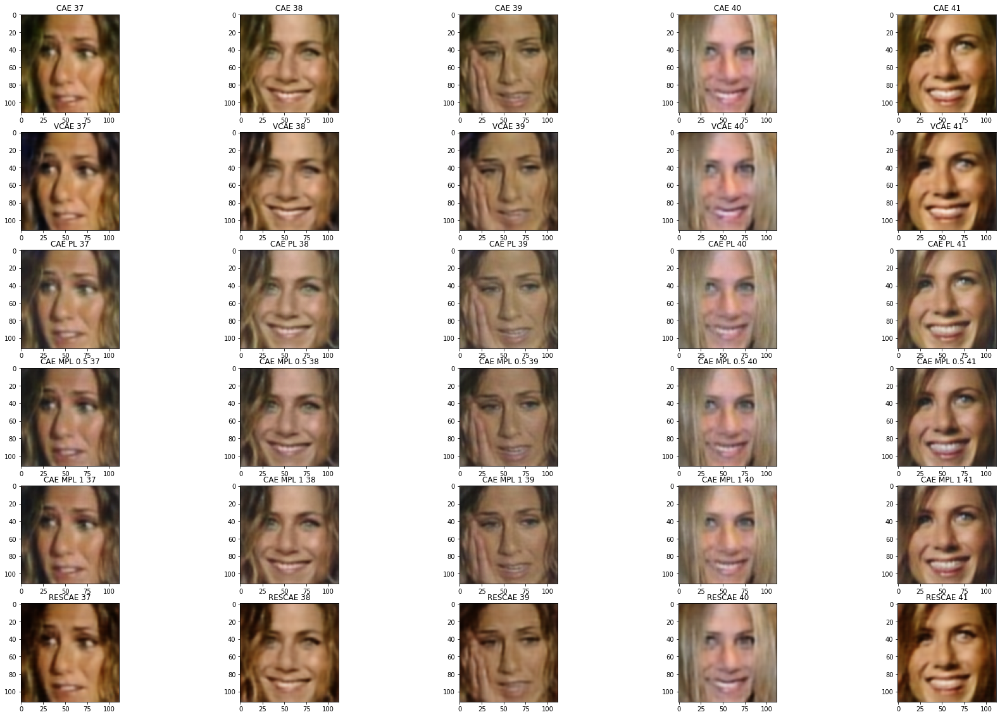

In [97]:
fig, ax = plt.subplots(nrows = 6, ncols = 5, figsize = (30, 20))
# subfig = fig.subfigures(nrows = 1, ncols = 5)
# subfig[0].suptitle('cae')
# subfig[1].suptitle('cae_mpl_1')

idx = 37

for i in range(5):
    ax[0, i].imshow(pre_plot_img(output_cae[idx]))
    ax[0, i].set_title(f'CAE {idx}')

    ax[1, i].imshow(pre_plot_img(output_vcae[idx]))
    ax[1, i].set_title(f'VCAE {idx}')
    
    ax[2, i].imshow(pre_plot_img(output_cae_pl[idx]))
    ax[2, i].set_title(f'CAE PL {idx}')

    ax[3, i].imshow(pre_plot_img(output_cae_mpl_05[idx]))
    ax[3, i].set_title(f'CAE MPL 0.5 {idx}')

    ax[4, i].imshow(pre_plot_img(output_cae_mpl_1[idx]))
    ax[4, i].set_title(f'CAE MPL 1 {idx}')

    ax[5, i].imshow(pre_plot_img(output_rescae[idx]))
    ax[5, i].set_title(f'RESCAE {idx}')
    idx += 1

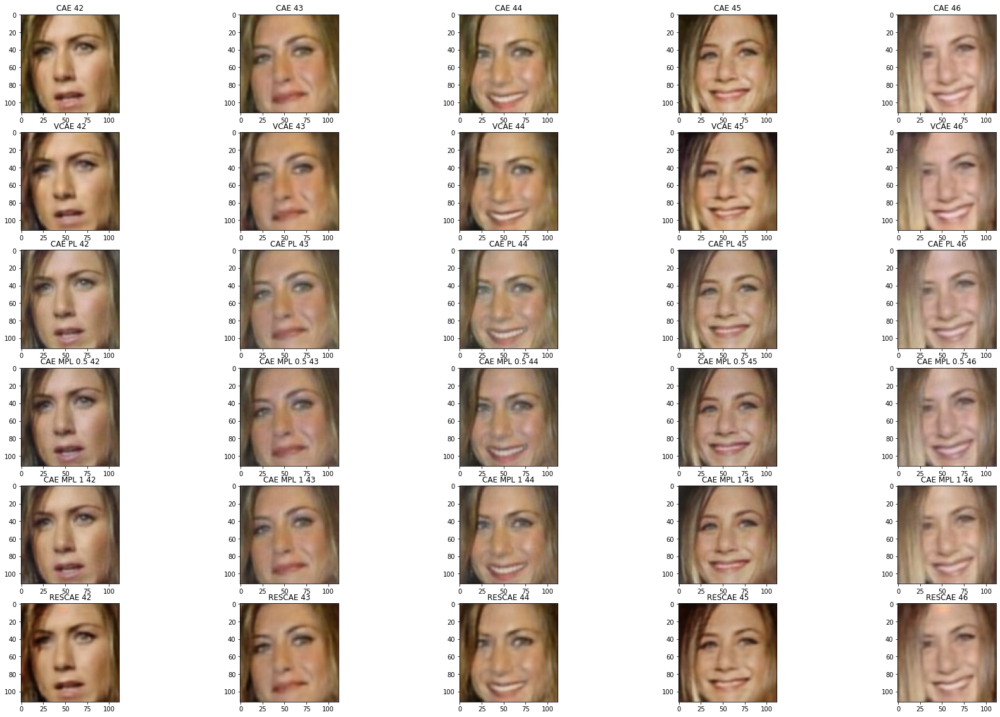

In [98]:
fig, ax = plt.subplots(nrows = 6, ncols = 5, figsize = (30, 20))
# subfig = fig.subfigures(nrows = 1, ncols = 5)
# subfig[0].suptitle('cae')
# subfig[1].suptitle('cae_mpl_1')

idx = 37 + 5

for i in range(5):
    ax[0, i].imshow(pre_plot_img(output_cae[idx]))
    ax[0, i].set_title(f'CAE {idx}')

    ax[1, i].imshow(pre_plot_img(output_vcae[idx]))
    ax[1, i].set_title(f'VCAE {idx}')
    
    ax[2, i].imshow(pre_plot_img(output_cae_pl[idx]))
    ax[2, i].set_title(f'CAE PL {idx}')

    ax[3, i].imshow(pre_plot_img(output_cae_mpl_05[idx]))
    ax[3, i].set_title(f'CAE MPL 0.5 {idx}')

    ax[4, i].imshow(pre_plot_img(output_cae_mpl_1[idx]))
    ax[4, i].set_title(f'CAE MPL 1 {idx}')

    ax[5, i].imshow(pre_plot_img(output_rescae[idx]))
    ax[5, i].set_title(f'RESCAE {idx}')
    idx += 1

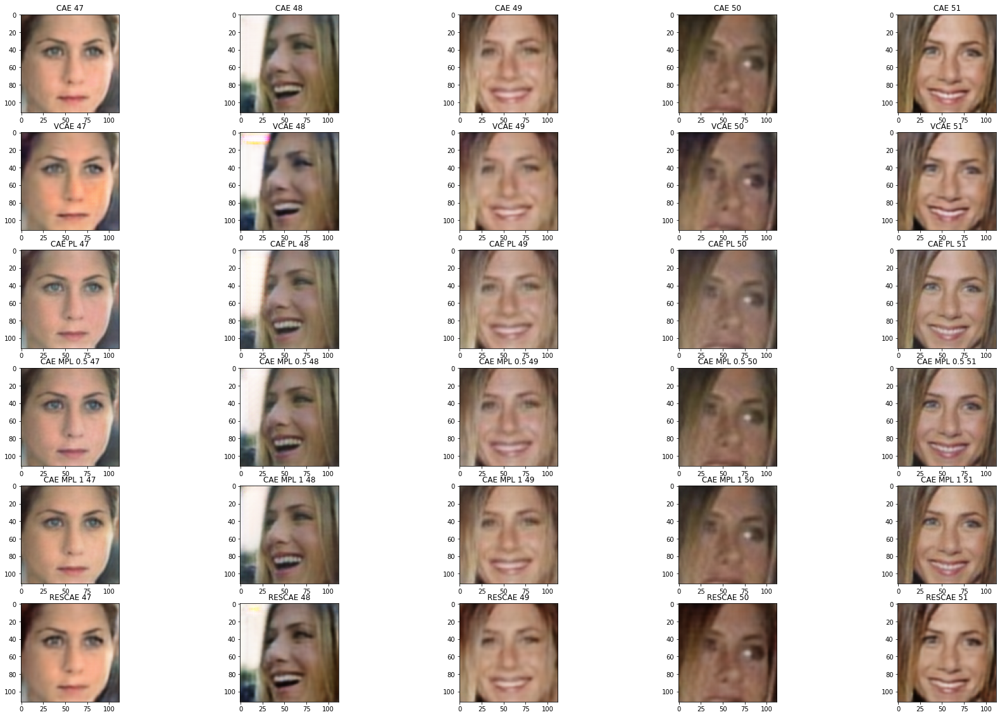

In [99]:
fig, ax = plt.subplots(nrows = 6, ncols = 5, figsize = (30, 20))
# subfig = fig.subfigures(nrows = 1, ncols = 5)
# subfig[0].suptitle('cae')
# subfig[1].suptitle('cae_mpl_1')

idx = 37 + 5 + 5

for i in range(5):
    ax[0, i].imshow(pre_plot_img(output_cae[idx]))
    ax[0, i].set_title(f'CAE {idx}')

    ax[1, i].imshow(pre_plot_img(output_vcae[idx]))
    ax[1, i].set_title(f'VCAE {idx}')
    
    ax[2, i].imshow(pre_plot_img(output_cae_pl[idx]))
    ax[2, i].set_title(f'CAE PL {idx}')

    ax[3, i].imshow(pre_plot_img(output_cae_mpl_05[idx]))
    ax[3, i].set_title(f'CAE MPL 0.5 {idx}')

    ax[4, i].imshow(pre_plot_img(output_cae_mpl_1[idx]))
    ax[4, i].set_title(f'CAE MPL 1 {idx}')

    ax[5, i].imshow(pre_plot_img(output_rescae[idx]))
    ax[5, i].set_title(f'RESCAE {idx}')
    idx += 1

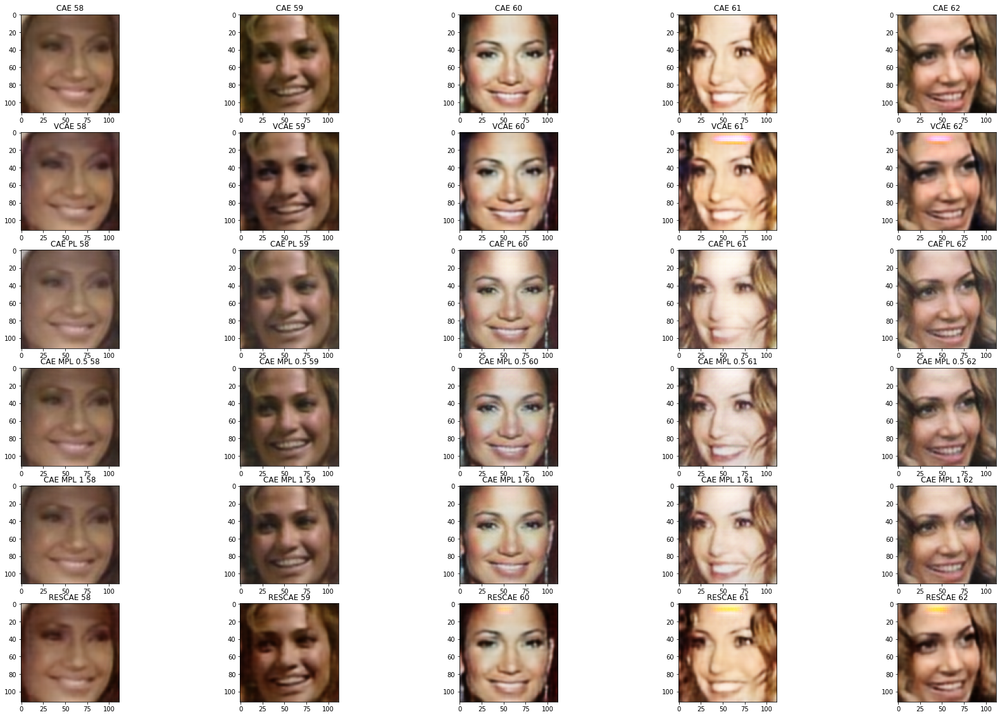

In [100]:
fig, ax = plt.subplots(nrows = 6, ncols = 5, figsize = (30, 20))
# subfig = fig.subfigures(nrows = 1, ncols = 5)
# subfig[0].suptitle('cae')
# subfig[1].suptitle('cae_mpl_1')

idx = 58

for i in range(5):
    ax[0, i].imshow(pre_plot_img(output_cae[idx]))
    ax[0, i].set_title(f'CAE {idx}')

    ax[1, i].imshow(pre_plot_img(output_vcae[idx]))
    ax[1, i].set_title(f'VCAE {idx}')
    
    ax[2, i].imshow(pre_plot_img(output_cae_pl[idx]))
    ax[2, i].set_title(f'CAE PL {idx}')

    ax[3, i].imshow(pre_plot_img(output_cae_mpl_05[idx]))
    ax[3, i].set_title(f'CAE MPL 0.5 {idx}')

    ax[4, i].imshow(pre_plot_img(output_cae_mpl_1[idx]))
    ax[4, i].set_title(f'CAE MPL 1 {idx}')

    ax[5, i].imshow(pre_plot_img(output_rescae[idx]))
    ax[5, i].set_title(f'RESCAE {idx}')
    idx += 1

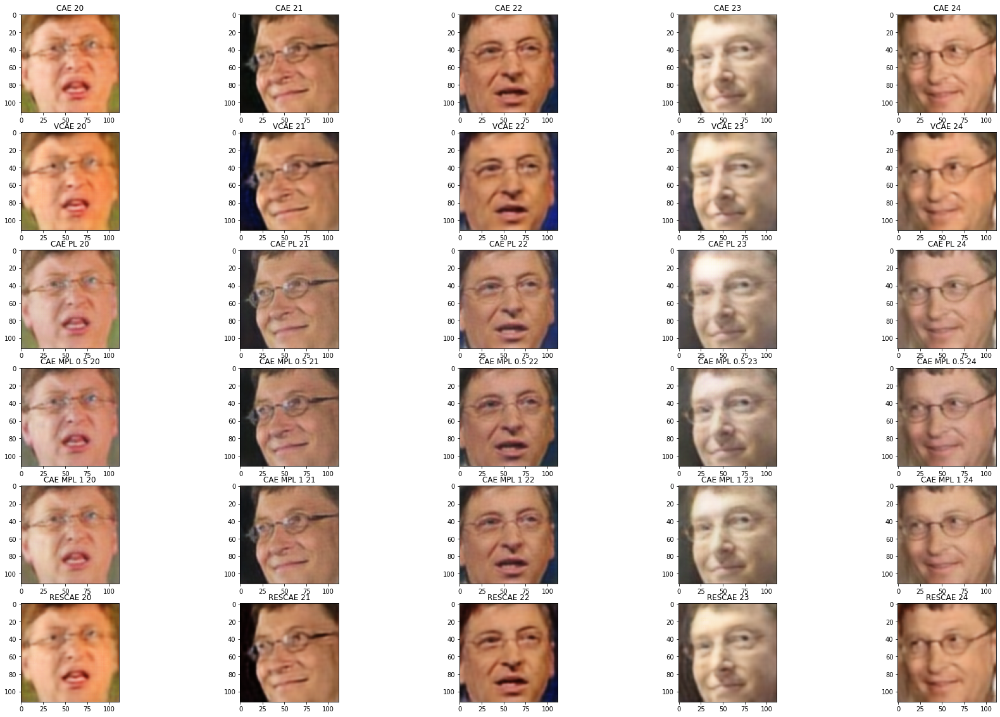

In [101]:
fig, ax = plt.subplots(nrows = 6, ncols = 5, figsize = (30, 20))
# subfig = fig.subfigures(nrows = 1, ncols = 5)
# subfig[0].suptitle('cae')
# subfig[1].suptitle('cae_mpl_1')

idx = 20

for i in range(5):
    ax[0, i].imshow(pre_plot_img(output_cae[idx]))
    ax[0, i].set_title(f'CAE {idx}')

    ax[1, i].imshow(pre_plot_img(output_vcae[idx]))
    ax[1, i].set_title(f'VCAE {idx}')
    
    ax[2, i].imshow(pre_plot_img(output_cae_pl[idx]))
    ax[2, i].set_title(f'CAE PL {idx}')

    ax[3, i].imshow(pre_plot_img(output_cae_mpl_05[idx]))
    ax[3, i].set_title(f'CAE MPL 0.5 {idx}')

    ax[4, i].imshow(pre_plot_img(output_cae_mpl_1[idx]))
    ax[4, i].set_title(f'CAE MPL 1 {idx}')

    ax[5, i].imshow(pre_plot_img(output_rescae[idx]))
    ax[5, i].set_title(f'RESCAE {idx}')
    idx += 1

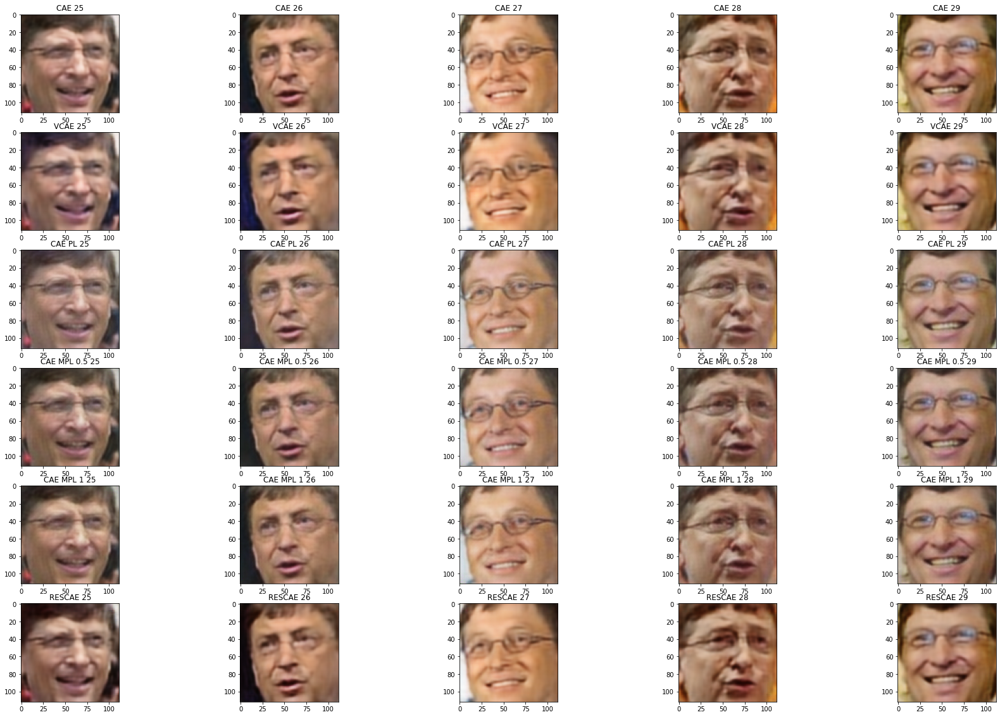

In [102]:
fig, ax = plt.subplots(nrows = 6, ncols = 5, figsize = (30, 20))
# subfig = fig.subfigures(nrows = 1, ncols = 5)
# subfig[0].suptitle('cae')
# subfig[1].suptitle('cae_mpl_1')

idx = 20 + 5

for i in range(5):
    ax[0, i].imshow(pre_plot_img(output_cae[idx]))
    ax[0, i].set_title(f'CAE {idx}')

    ax[1, i].imshow(pre_plot_img(output_vcae[idx]))
    ax[1, i].set_title(f'VCAE {idx}')
    
    ax[2, i].imshow(pre_plot_img(output_cae_pl[idx]))
    ax[2, i].set_title(f'CAE PL {idx}')

    ax[3, i].imshow(pre_plot_img(output_cae_mpl_05[idx]))
    ax[3, i].set_title(f'CAE MPL 0.5 {idx}')

    ax[4, i].imshow(pre_plot_img(output_cae_mpl_1[idx]))
    ax[4, i].set_title(f'CAE MPL 1 {idx}')

    ax[5, i].imshow(pre_plot_img(output_rescae[idx]))
    ax[5, i].set_title(f'RESCAE {idx}')
    idx += 1

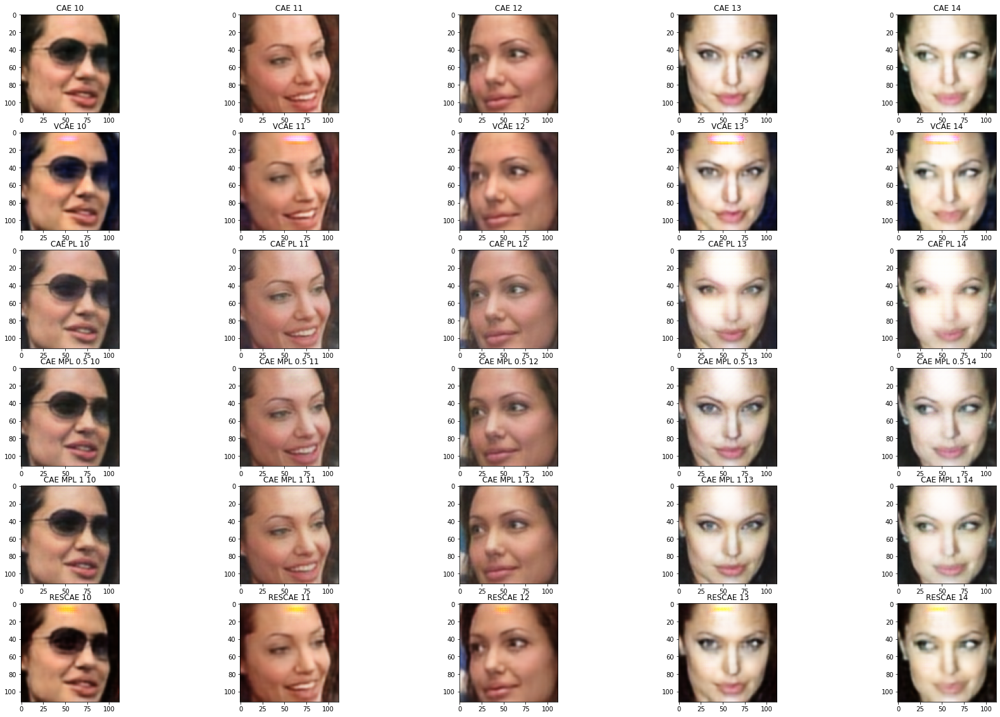

In [103]:
fig, ax = plt.subplots(nrows = 6, ncols = 5, figsize = (30, 20))
# subfig = fig.subfigures(nrows = 1, ncols = 5)
# subfig[0].suptitle('cae')
# subfig[1].suptitle('cae_mpl_1')

idx = 10

for i in range(5):
    ax[0, i].imshow(pre_plot_img(output_cae[idx]))
    ax[0, i].set_title(f'CAE {idx}')

    ax[1, i].imshow(pre_plot_img(output_vcae[idx]))
    ax[1, i].set_title(f'VCAE {idx}')
    
    ax[2, i].imshow(pre_plot_img(output_cae_pl[idx]))
    ax[2, i].set_title(f'CAE PL {idx}')

    ax[3, i].imshow(pre_plot_img(output_cae_mpl_05[idx]))
    ax[3, i].set_title(f'CAE MPL 0.5 {idx}')

    ax[4, i].imshow(pre_plot_img(output_cae_mpl_1[idx]))
    ax[4, i].set_title(f'CAE MPL 1 {idx}')

    ax[5, i].imshow(pre_plot_img(output_rescae[idx]))
    ax[5, i].set_title(f'RESCAE {idx}')
    idx += 1

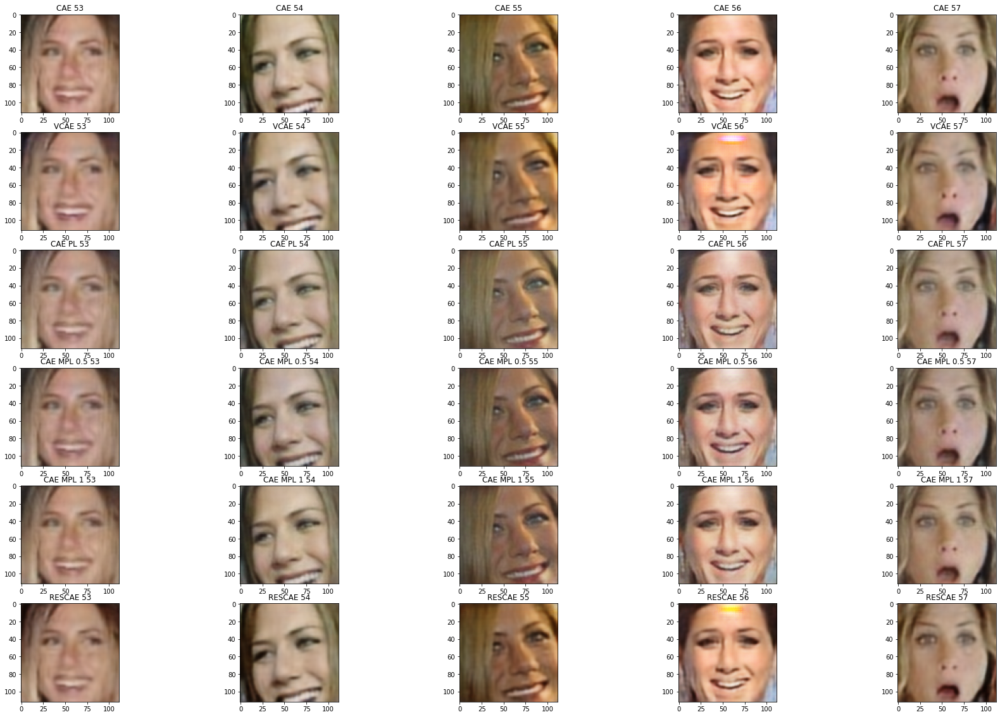

In [104]:
fig, ax = plt.subplots(nrows = 6, ncols = 5, figsize = (30, 20))
# subfig = fig.subfigures(nrows = 1, ncols = 5)
# subfig[0].suptitle('cae')
# subfig[1].suptitle('cae_mpl_1')

idx = 53

for i in range(5):
    ax[0, i].imshow(pre_plot_img(output_cae[idx]))
    ax[0, i].set_title(f'CAE {idx}')

    ax[1, i].imshow(pre_plot_img(output_vcae[idx]))
    ax[1, i].set_title(f'VCAE {idx}')
    
    ax[2, i].imshow(pre_plot_img(output_cae_pl[idx]))
    ax[2, i].set_title(f'CAE PL {idx}')

    ax[3, i].imshow(pre_plot_img(output_cae_mpl_05[idx]))
    ax[3, i].set_title(f'CAE MPL 0.5 {idx}')

    ax[4, i].imshow(pre_plot_img(output_cae_mpl_1[idx]))
    ax[4, i].set_title(f'CAE MPL 1 {idx}')

    ax[5, i].imshow(pre_plot_img(output_rescae[idx]))
    ax[5, i].set_title(f'RESCAE {idx}')
    idx += 1

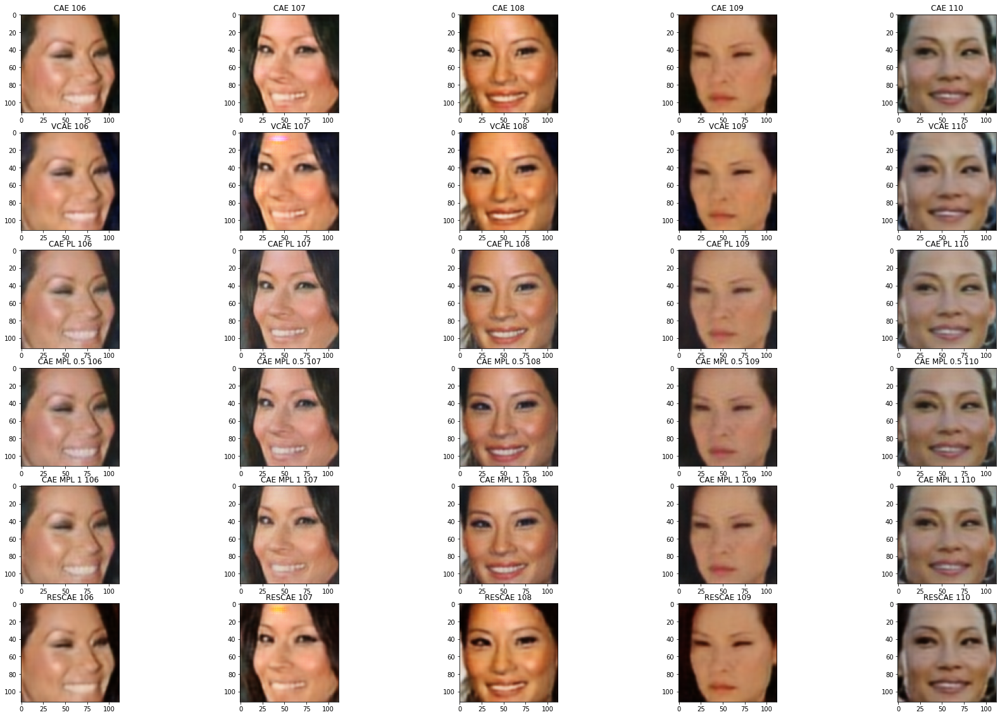

In [105]:
fig, ax = plt.subplots(nrows = 6, ncols = 5, figsize = (30, 20))
# subfig = fig.subfigures(nrows = 1, ncols = 5)
# subfig[0].suptitle('cae')
# subfig[1].suptitle('cae_mpl_1')

idx = 106

for i in range(5):
    ax[0, i].imshow(pre_plot_img(output_cae[idx]))
    ax[0, i].set_title(f'CAE {idx}')

    ax[1, i].imshow(pre_plot_img(output_vcae[idx]))
    ax[1, i].set_title(f'VCAE {idx}')
    
    ax[2, i].imshow(pre_plot_img(output_cae_pl[idx]))
    ax[2, i].set_title(f'CAE PL {idx}')

    ax[3, i].imshow(pre_plot_img(output_cae_mpl_05[idx]))
    ax[3, i].set_title(f'CAE MPL 0.5 {idx}')

    ax[4, i].imshow(pre_plot_img(output_cae_mpl_1[idx]))
    ax[4, i].set_title(f'CAE MPL 1 {idx}')

    ax[5, i].imshow(pre_plot_img(output_rescae[idx]))
    ax[5, i].set_title(f'RESCAE {idx}')
    idx += 1

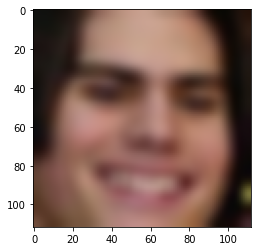

In [142]:
plt.imshow(test_dataset[0][0].numpy().transpose([1, 2, 0]) * 0.5 + 0.5)
# plt.savefig('omino_sfocato.jpg')
plt.imsave('omino_sfocato.jpg', test_dataset[0][0].numpy().transpose([1, 2, 0]) * 0.5 + 0.5)

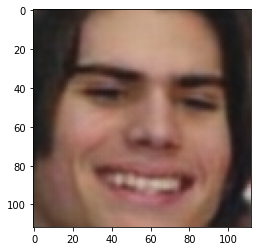

In [108]:
plt.imshow(cae_mpl_1(test_dataset[0][0].unsqueeze(0)).squeeze(0).detach().numpy().transpose([1, 2, 0]) * 0.5 + 0.5)
# plt.savefig('omino_sistemato.jpg')
plt.imsave('omino_sistemato.jpg', (cae_mpl_1(test_dataset[0][0].unsqueeze(0)).squeeze(0).detach().numpy().transpose([1, 2, 0]) * 0.5 + 0.5))

In [110]:
x = test_dataset[0][0].unsqueeze(0)
x1 = nn.Conv2d(3, 64, 9)(x)
x2 = nn.Conv2d(64, 64, 4, stride=2, padding=1)(x1)
x3 = nn.Conv2d(64, 128, 4, stride=2, padding=1)(x2)
x4 = nn.Conv2d(128, 256, 4, stride=2)(x3)
print(x1.shape)
print(x2.shape)
print(x3.shape)
print(x4.shape)

torch.Size([1, 64, 104, 104])
torch.Size([1, 64, 52, 52])
torch.Size([1, 128, 26, 26])
torch.Size([1, 256, 12, 12])


In [111]:
import pickle

In [115]:
with open('./cae_overfit/CAE_validation_loss', 'rb') as f:
    cae_val_loss = pickle.load(f)

In [119]:
np.argmin(cae_val_loss)

26

In [29]:
def metrics(img, rec_img, device = device):
  psnr, ssim = PSNR().to(device), SSIM().to(device)
  
  img = img.unsqueeze(0).to(device)
  rec_img = rec_img.unsqueeze(0).to(device)
  
  return float(psnr(rec_img, img).detach().cpu().numpy()), float(ssim(rec_img, img).detach().cpu().numpy())

In [30]:
def print_metrics(idx):
    print('blur:', metrics(inputs[idx], inputs_blur[idx]))

    print('cae:', metrics(inputs[idx], output_cae[idx]))
    print('vcae:', metrics(inputs[idx], output_vcae[idx]))
    print('cae pl:', metrics(inputs[idx], output_cae_pl[idx]))
    print('cae mpl 0.5:', metrics(inputs[idx], output_cae_mpl_05[idx]))
    print('cae mpl 1:', metrics(inputs[idx], output_cae_mpl_1[idx]))
    print('rescae:', metrics(inputs[idx], output_rescae[idx]))

In [75]:
print_metrics(0)

cae: (12.665884017944336, -0.18977898359298706)
vcae: (13.122379302978516, -0.1488659828901291)
cae pl: (14.788495063781738, -0.09480255842208862)
cae mpl 0.5: (12.924643516540527, -0.18195097148418427)
cae mpl 1: (12.912877082824707, -0.18497838079929352)
rescae: (11.330552101135254, -0.22603434324264526)


c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


In [31]:
print_metrics(25)

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


blur: (25.420257568359375, 0.6316539645195007)
cae: (29.364887237548828, 0.8235989809036255)
vcae: (27.20038414001465, 0.7577137351036072)
cae pl: (24.24505615234375, 0.7406975030899048)
cae mpl 0.5: (27.479969024658203, 0.8070183992385864)
cae mpl 1: (27.322364807128906, 0.7979739308357239)
rescae: (26.81842041015625, 0.7782925367355347)


In [32]:
metrics(inputs[25], inputs_blur[25])

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


(25.420257568359375, 0.6316539645195007)

In [33]:
metrics(inputs[12], inputs_blur[12])

(27.446224212646484, 0.7843814492225647)

In [34]:
# AGGIORNATO
for i in [0, 12, 22, 25, 108]:
    print(i)
    print_metrics(i)

0
blur: (27.017427444458008, 0.7506471276283264)
cae: (31.087692260742188, 0.891209065914154)
vcae: (29.517499923706055, 0.8506331443786621)
cae pl: (27.97450065612793, 0.8510355949401855)
cae mpl 0.5: (28.623266220092773, 0.847234308719635)
cae mpl 1: (28.21265983581543, 0.8219379186630249)
rescae: (28.73358917236328, 0.8189813494682312)
12
blur: (27.446224212646484, 0.7843814492225647)
cae: (31.621517181396484, 0.9131831526756287)
vcae: (28.63299560546875, 0.836858868598938)
cae pl: (25.45853614807129, 0.8351069092750549)
cae mpl 0.5: (27.907865524291992, 0.883605420589447)
cae mpl 1: (29.017316818237305, 0.9064494967460632)
rescae: (28.702425003051758, 0.8560174107551575)
22
blur: (25.380535125732422, 0.6838983297348022)
cae: (30.075599670410156, 0.8775150775909424)
vcae: (26.764116287231445, 0.8155786395072937)
cae pl: (23.37857437133789, 0.7525085210800171)
cae mpl 0.5: (24.912324905395508, 0.8099715709686279)
cae mpl 1: (26.227970123291016, 0.8494008779525757)
rescae: (28.2852611

In [32]:
# psnr_cae, ssim_cae = mymetrics(cae, device, test_dataset, verbose = False)
# psnr_vcae, ssim_vcae = mymetrics(vcae, device, test_dataset, verbose = False)
# psnr_cae_pl, ssim_cae_pl = mymetrics(cae_pl, device, test_dataset, verbose = False)
# psnr_cae_mpl_05, ssim_cae_mpl_05 = mymetrics(cae_mpl_05, device, test_dataset, verbose = False)
psnr_cae_mpl_1, ssim_cae_mpl_1 = mymetrics(cae_mpl_1, device, test_dataset, verbose = False)
psnr_rescae, ssim_rescae = mymetrics(rescae, device, test_dataset, verbose = False)

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
3708it [01:50, 33.57it/s]
3708it [01:07, 55.01it/s]


In [33]:
# np.savetxt('./metrics/psnr_cae.txt', psnr_cae)
# np.savetxt('./metrics/ssim_cae.txt', ssim_cae)
psnr_cae = np.loadtxt('./metrics/psnr_cae.txt')
ssim_cae = np.loadtxt('./metrics/ssim_cae.txt')

In [34]:
# np.savetxt('./metrics/psnr_vcae.txt', psnr_vcae)
# np.savetxt('./metrics/ssim_vcae.txt', ssim_vcae)

In [35]:
psnr_vcae = np.loadtxt('./metrics/psnr_vcae.txt')
ssim_vcae = np.loadtxt('./metrics/ssim_vcae.txt')

In [36]:
# np.savetxt('./metrics/psnr_cae_pl.txt', psnr_cae_pl)
# np.savetxt('./metrics/ssim_cae_pl.txt', ssim_cae_pl)

In [37]:
psnr_cae_pl = np.loadtxt('./metrics/psnr_cae_pl.txt')
ssim_cae_pl = np.loadtxt('./metrics/ssim_cae_pl.txt')

In [38]:
# np.savetxt('./metrics/psnr_cae_mpl_05.txt', psnr_cae_mpl_05)
# np.savetxt('./metrics/ssim_cae_mpl_05.txt', ssim_cae_mpl_05)

In [39]:
psnr_cae_mpl_05 = np.loadtxt('./metrics/psnr_cae_mpl_05.txt')
ssim_cae_mpl_05 = np.loadtxt('./metrics/ssim_cae_mpl_05.txt')

In [40]:
# np.savetxt('./metrics/psnr_cae_mpl_1.txt', psnr_cae_mpl_1)
# np.savetxt('./metrics/ssim_cae_mpl_1.txt', ssim_cae_mpl_1)

In [ ]:
psnr_cae_mpl_1 = np.loadtxt('./metrics/psnr_cae_mpl_1.txt')
ssim_cae_mpl_1 = np.loadtxt('./metrics/ssim_cae_mpl_1.txt')

In [41]:
# np.savetxt('./metrics/psnr_rescae.txt', psnr_rescae)
# np.savetxt('./metrics/ssim_rescae.txt', ssim_rescae)

In [ ]:
psnr_rescae = np.loadtxt('./metrics/psnr_rescae.txt')
ssim_rescae = np.loadtxt('./metrics/ssim_rescae.txt')

In [54]:
print(psnr_cae.argmax())
print(psnr_vcae.argmax())
print(psnr_rescae.argmax())

2216
1076
1040


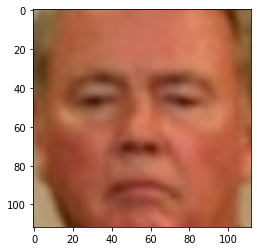

In [53]:
plot_img(test_dataset[1040][1])

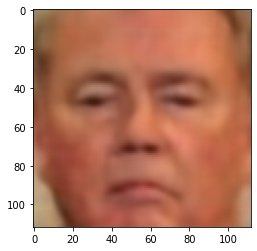

In [55]:
plot_img(vcae(test_dataset[1040][0].unsqueeze(0)).squeeze(0))

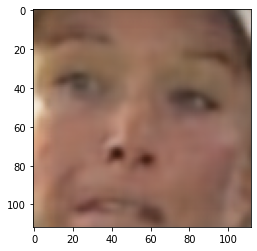

In [58]:
plot_img(vcae(test_dataset[2216][0].unsqueeze(0)).squeeze(0))

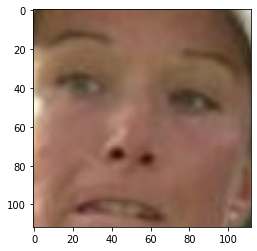

In [59]:
plot_img(test_dataset[2216][1])

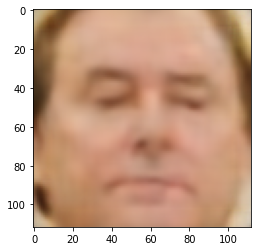

In [60]:
plot_img(vcae(test_dataset[1076][0].unsqueeze(0)).squeeze(0))

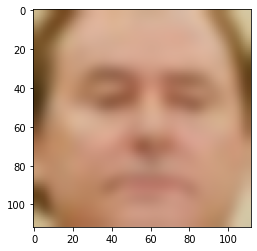

In [62]:
plot_img(test_dataset[1076][0])

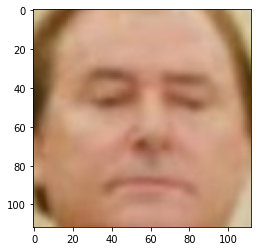

In [61]:
plot_img(test_dataset[1076][1])

In [115]:
def save_images(idx):
    plt.imsave(f'./immagini_report/base_{idx}.jpg', pre_plot_img(inputs[idx]))
    plt.imsave(f'./immagini_report/blur_{idx}.jpg', pre_plot_img(inputs_blur[idx]))

    plt.imsave(f'./immagini_report/cae_{idx}.jpg', pre_plot_img(output_cae[idx]))
    plt.imsave(f'./immagini_report/vcae_{idx}.jpg', pre_plot_img(output_vcae[idx]))
    plt.imsave(f'./immagini_report/rescae_{idx}.jpg', pre_plot_img(output_rescae[idx]))
    plt.imsave(f'./immagini_report/cae_pl_{idx}.jpg', pre_plot_img(output_cae_pl[idx]))
    plt.imsave(f'./immagini_report/cae_mpl_05_{idx}.jpg', pre_plot_img(output_cae_mpl_05[idx]))
    plt.imsave(f'./immagini_report/cae_mpl_1_{idx}.jpg', pre_plot_img(output_cae_mpl_1[idx]))

In [133]:
for i in [0, 12, 22, 25, 108]: #[0, 2, 23, 42, 51]:
    save_images(i)

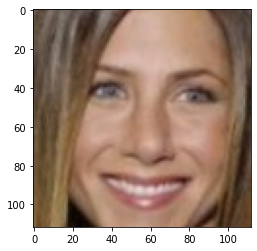

In [77]:
plt.imshow(pre_plot_img(inputs[51]))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


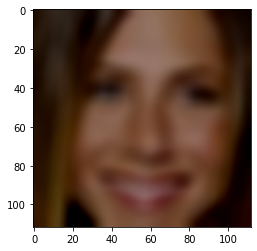

In [72]:
plt.imshow(pre_plot_img(blur_transform_tensor(inputs[51])))

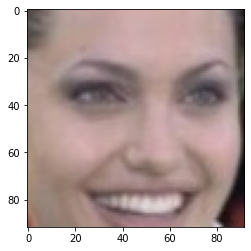

In [120]:
plot_img(transforms.CenterCrop(92)(inputs[0]))

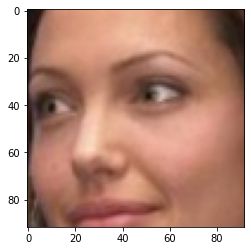

In [121]:
plot_img(transforms.CenterCrop(92)(inputs[12]))

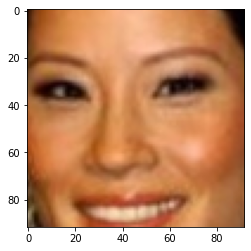

In [122]:
plot_img(transforms.CenterCrop(92)(inputs[108]))

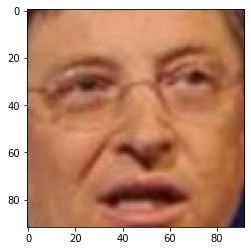

In [123]:
plot_img(transforms.CenterCrop(92)(inputs[22]))

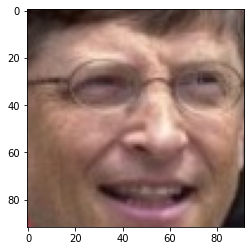

In [124]:
plot_img(transforms.CenterCrop(92)(inputs[25]))

In [134]:
def save_images_cropped(idx):
    crop = transforms.CenterCrop(92)
    plt.imsave(f'./immagini_report/base_cropped_{idx}.jpg', pre_plot_img(crop(inputs[idx])))
    plt.imsave(f'./immagini_report/blur_cropped_{idx}.jpg', pre_plot_img(crop(inputs_blur[idx])))

    plt.imsave(f'./immagini_report/cae_cropped_{idx}.jpg', pre_plot_img(crop(output_cae[idx])))
    plt.imsave(f'./immagini_report/vcae_cropped_{idx}.jpg', pre_plot_img(crop(output_vcae[idx])))
    plt.imsave(f'./immagini_report/rescae_cropped_{idx}.jpg', pre_plot_img(crop(output_rescae[idx])))
    plt.imsave(f'./immagini_report/cae_pl_cropped_{idx}.jpg', pre_plot_img(crop(output_cae_pl[idx])))
    plt.imsave(f'./immagini_report/cae_mpl_05_cropped_{idx}.jpg', pre_plot_img(crop(output_cae_mpl_05[idx])))
    plt.imsave(f'./immagini_report/cae_mpl_1_cropped_{idx}.jpg', pre_plot_img(crop(output_cae_mpl_1[idx])))

In [135]:
for i in [0, 12, 22, 25, 108]: #[0, 2, 23, 42, 51]:
    save_images_cropped(i)

In [138]:
print_metrics(0)

blur: (27.017427444458008, 0.7506471276283264)
cae: (31.087692260742188, 0.891209065914154)
vcae: (28.963163375854492, 0.8480232357978821)
cae pl: (27.97450065612793, 0.8510355949401855)
cae mpl 0.5: (28.623266220092773, 0.847234308719635)
cae mpl 1: (28.21265983581543, 0.8219379186630249)
rescae: (28.73358917236328, 0.8189813494682312)


c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


In [85]:
def mymetrics_noise(dataset, verbose = True):
  psnr, ssim = PSNR(), SSIM() # PSNR().to(device), SSIM().to(device)
  psnr_values = np.zeros(len(dataset))
  ssim_values = np.zeros(len(dataset))
  
  for ix, sample in tqdm(enumerate(dataset)):
    img = sample[0].unsqueeze(0)#.to(device)
    lab = sample[1].unsqueeze(0)#.to(device)
    
    psnr_values[ix], ssim_values[ix] = psnr(img, lab).cpu().numpy(), ssim(img, lab).cpu().numpy()

  if verbose:
    # print('\n')
    metric_insight(psnr_values, ssim_values)
  return psnr_values, ssim_values

In [146]:
# psnr_blur, ssim_blur = mymetrics_noise(test_dataset)

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
3708it [00:40, 92.33it/s] 

AVG PSNR: 26.670168891050796
MAX PSNR: 33.82801055908203
AVG SSIM: 0.7300872351680887
MAX SSIM: 0.920658528804779


In [147]:
# np.savetxt('./metrics/psnr_blur.txt', psnr_blur)
# np.savetxt('./metrics/ssim_blur.txt', ssim_blur)

In [ ]:
psnr_blur = np.loadtxt('./metrics/psnr_blur.txt')
ssim_blur = np.loadtxt('./metrics/ssim_blur.txt')

In [154]:
metric_insight(psnr_cae_mpl_1, ssim_cae_mpl_1)

AVG PSNR: 27.265094756051305
MAX PSNR: 33.520626068115234
AVG SSIM: 0.8600943883420837
MAX SSIM: 0.9501433372497559


## epoche a confronto

In [17]:
cae_e0 = ConvAutoencoder()
cae_e0.load_state_dict(torch.load('./epoche/cae_e0.pth'))

cae_e4 = ConvAutoencoder()
cae_e4.load_state_dict(torch.load('./epoche/cae_e4.pth'))

cae_e9 = ConvAutoencoder()
cae_e9.load_state_dict(torch.load('./epoche/cae_e9.pth'))

cae_e14 = ConvAutoencoder()
cae_e14.load_state_dict(torch.load('./epoche/cae_e14.pth'))

<All keys matched successfully>

In [18]:
cae_pl_e0 = ConvAutoencoder()
cae_pl_e0.load_state_dict(torch.load('./epoche/cae_pl_e0.pth'))

cae_pl_e4 = ConvAutoencoder()
cae_pl_e4.load_state_dict(torch.load('./epoche/cae_pl_e4.pth'))

cae_pl_e9 = ConvAutoencoder()
cae_pl_e9.load_state_dict(torch.load('./epoche/cae_pl_e9.pth'))

cae_pl_e14 = ConvAutoencoder()
cae_pl_e14.load_state_dict(torch.load('./epoche/cae_pl_e14.pth'))

<All keys matched successfully>

In [27]:
mymetrics(cae_e0, device, test_dataset)
print('cae_e0')

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
3708it [01:18, 47.46it/s]

AVG PSNR: 23.19504864779105
MAX PSNR: 28.369569778442383
AVG SSIM: 0.6253027324409032
MAX SSIM: 0.8619239926338196
cae_e0


In [28]:
mymetrics(cae_e4, device, test_dataset)
print('cae_e4')

3708it [00:56, 65.78it/s]

AVG PSNR: 28.763598555242872
MAX PSNR: 34.078338623046875
AVG SSIM: 0.8253721397414305
MAX SSIM: 0.9290109872817993
cae_e4


In [29]:
mymetrics(cae_e9, device, test_dataset)
print('cae_e9')

3708it [00:59, 62.76it/s]

AVG PSNR: 29.72753331267718
MAX PSNR: 34.38093566894531
AVG SSIM: 0.8488575469264449
MAX SSIM: 0.9361914992332458
cae_e9


In [30]:
mymetrics(cae_e14, device, test_dataset)
print('cae_e14')

3708it [00:56, 65.55it/s]

AVG PSNR: 31.066849686952857
MAX PSNR: 36.56336975097656
AVG SSIM: 0.8711334368557606
MAX SSIM: 0.9521999955177307
cae_e14


In [31]:
mymetrics(cae_pl_e0, device, test_dataset)
print('cae_pl_e0')

3708it [00:59, 62.75it/s]

AVG PSNR: 10.472834872582197
MAX PSNR: 14.394285202026367
AVG SSIM: -0.00497840031301386
MAX SSIM: 0.5268117189407349
cae_pl_e0


In [19]:
mymetrics(cae_pl_e4, device, test_dataset)
print('cae_pl_e4')

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
3708it [01:13, 50.67it/s]

AVG PSNR: 18.27782373469496
MAX PSNR: 23.506832122802734
AVG SSIM: 0.45092262029888946
MAX SSIM: 0.714363157749176
cae_pl_e4


In [20]:
mymetrics(cae_pl_e9, device, test_dataset)
print('cae_pl_e9')

3708it [00:51, 72.18it/s]

AVG PSNR: 21.93717439223519
MAX PSNR: 29.648666381835938
AVG SSIM: 0.6398431710505048
MAX SSIM: 0.8652905225753784
cae_pl_e9


In [21]:
mymetrics(cae_pl_e14, device, test_dataset)
print('cae_pl_e14')

3708it [00:55, 66.81it/s]

AVG PSNR: 24.283280951819886
MAX PSNR: 31.417388916015625
AVG SSIM: 0.7889024237695249
MAX SSIM: 0.8904519081115723
cae_pl_e14


In [22]:
t = test_dataset[0][0].unsqueeze(0)

In [29]:
t = inputs_blur[0].unsqueeze(0)

In [28]:
cae_e0.eval()
cae_e4.eval()
cae_e9.eval()
cae_e14.eval()
cae_pl_e0.eval()
cae_pl_e4.eval()
cae_pl_e9.eval()
cae_pl_e14.eval()
print()

In [37]:
cae_e0.to('cpu')
cae_e4.to('cpu')
cae_e9.to('cpu')
cae_e14.to('cpu')
cae_pl_e0.to('cpu')
cae_pl_e4.to('cpu')
cae_pl_e9.to('cpu')
cae_pl_e14.to('cpu')
print()

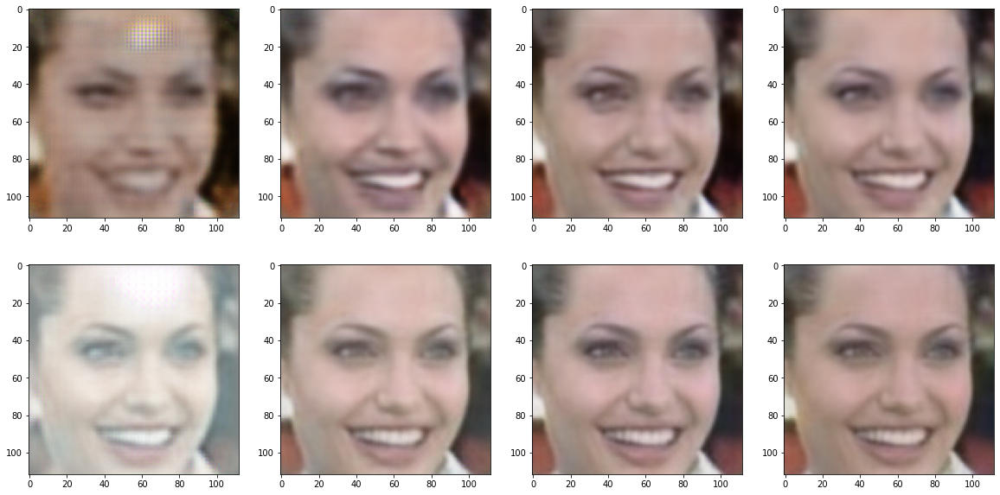

In [38]:
fig, ax = plt.subplots(nrows = 2, ncols = 4, figsize = (20, 10))

ax[0, 0].imshow(pre_plot_img(cae_e0(t).squeeze(0)))
ax[0, 1].imshow(pre_plot_img(cae_e4(t).squeeze(0)))
ax[0, 2].imshow(pre_plot_img(cae_e9(t).squeeze(0)))
ax[0, 3].imshow(pre_plot_img(cae_e14(t).squeeze(0)))

ax[1, 0].imshow(pre_plot_img(cae_pl_e0(t).squeeze(0)))
ax[1, 1].imshow(pre_plot_img(cae_pl_e4(t).squeeze(0)))
ax[1, 2].imshow(pre_plot_img(cae_pl_e9(t).squeeze(0)))
ax[1, 3].imshow(pre_plot_img(cae_pl_e14(t).squeeze(0)))

In [40]:
plt.imsave('./immagini_epoche/cae_e0.jpg', pre_plot_img(cae_e0(t).squeeze(0)))
plt.imsave('./immagini_epoche/cae_e4.jpg', pre_plot_img(cae_e4(t).squeeze(0)))
plt.imsave('./immagini_epoche/cae_e9.jpg', pre_plot_img(cae_e9(t).squeeze(0)))
plt.imsave('./immagini_epoche/cae_e14.jpg', pre_plot_img(cae_e14(t).squeeze(0)))

plt.imsave('./immagini_epoche/cae_pl_e0.jpg', pre_plot_img(cae_pl_e0(t).squeeze(0)))
plt.imsave('./immagini_epoche/cae_pl_e4.jpg', pre_plot_img(cae_pl_e4(t).squeeze(0)))
plt.imsave('./immagini_epoche/cae_pl_e9.jpg', pre_plot_img(cae_pl_e9(t).squeeze(0)))
plt.imsave('./immagini_epoche/cae_pl_e14.jpg', pre_plot_img(cae_pl_e14(t).squeeze(0)))

In [46]:
t2 = t.squeeze(0)
metrics(t2, cae_e0(t).squeeze(0))

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


(24.040191650390625, 0.622713565826416)

In [47]:
metrics(t2, cae_e4(t).squeeze(0))

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


(26.819496154785156, 0.7650353908538818)

In [48]:
metrics(t2, cae_e9(t).squeeze(0))

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


(26.509050369262695, 0.746104896068573)

In [49]:
metrics(t2, cae_e14(t).squeeze(0))

(27.48975372314453, 0.7826077938079834)

In [50]:
metrics(t2, cae_pl_e0(t).squeeze(0))

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


(11.52172565460205, 0.21377216279506683)

In [51]:
metrics(t2, cae_pl_e4(t).squeeze(0))

(20.073192596435547, 0.4962100386619568)

In [52]:
metrics(t2, cae_pl_e9(t).squeeze(0))

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


(24.667076110839844, 0.6545243859291077)

In [53]:
metrics(t2, cae_pl_e14(t).squeeze(0))

(26.552907943725586, 0.7213193774223328)

## pixelation

In [67]:
def pixelate(img, n_squares = 14, sides_squares = 8):
    x = np.asarray(img) # img è PIL..., non un array
    y = np.empty((n_squares, n_squares, 3))

    for j in range(n_squares): # y img
        for i in range(n_squares): # x img
            for k in range(3): # rgb channel
                y[i, j, k] = x[sides_squares*i:sides_squares*(i+1), sides_squares*j:sides_squares*(j+1), k].mean()
                
    return Image.fromarray(np.uint8(y)).resize(img.size, Image.NEAREST)

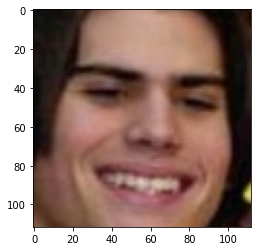

In [39]:
plot_img(test_dataset[0][1])

In [72]:
pixel_transform = transforms.Compose([
    transforms.CenterCrop(112),
    pixelate,
    transforms.ToTensor(),
    transforms.Normalize(0.5,0.5)])

In [73]:
test_dataset_pixel = AutoEncodeDataset(
    torchvision.datasets.LFWPeople(data_dir, split='test', download=True, transform=initial_transform),
    torchvision.datasets.LFWPeople(data_dir, split='test', download=True, transform=pixel_transform)
)

Files already downloaded and verified
Files already downloaded and verified


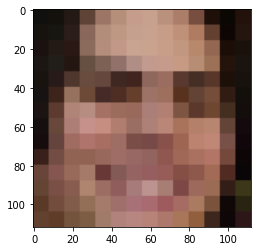

In [75]:
plot_img(test_dataset_pixel[0][0])

In [83]:
metrics(test_dataset_pixel[0][1], test_dataset_pixel[0][0])

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


(21.201784133911133, 0.43879351019859314)

In [86]:
mymetrics_noise(test_dataset_pixel)

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
3708it [02:02, 30.17it/s]

AVG PSNR: 22.42129134103061
MAX PSNR: 28.119884490966797
AVG SSIM: 0.4770052884549642
MAX SSIM: 0.7168182134628296


(array([21.20178413, 23.99125862, 21.18294334, ..., 22.11356926,
        21.46283722, 23.72740746]),
 array([0.43879372, 0.51478672, 0.46328416, ..., 0.46752328, 0.48732728,
        0.47942296]))

In [77]:
plt.imsave('./immagini_pixelation/omino_pixel.jpg', pre_plot_img(test_dataset_pixel[0][0]))

In [78]:
plt.imsave('./immagini_pixelation/omino_originale.jpg', pre_plot_img(test_dataset_pixel[0][1]))

In [80]:
cae_pixel = ConvAutoencoder()
cae_pixel.load_state_dict(torch.load('cae_pixelated.pth'))
cae_pixel.eval()
print()

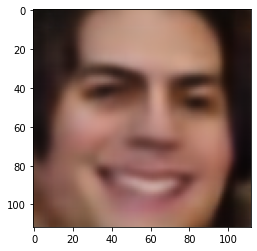

In [81]:
plot_img(cae_pixel(test_dataset_pixel[0][0].unsqueeze(0)).squeeze(0))

In [82]:
plt.imsave('./immagini_pixelation/omino_cae.jpg', pre_plot_img(cae_pixel(test_dataset_pixel[0][0].unsqueeze(0)).squeeze(0)))

In [87]:
metrics(test_dataset_pixel[0][1], cae_pixel(test_dataset_pixel[0][0].unsqueeze(0)).squeeze(0))

(25.83879280090332, 0.7493383288383484)

In [88]:
mymetrics(cae_pixel, device, test_dataset_pixel)
print('cae pixel')

c:\Users\ma_gi\AppData\Local\Programs\Python\Python39\lib\site-packages\torchmetrics\utilities\prints.py:36: UserWarning: Metric `SSIM` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)
3708it [01:23, 44.28it/s]

AVG PSNR: 25.397881332981804
MAX PSNR: 31.433691024780273
AVG SSIM: 0.6764224999721896
MAX SSIM: 0.8593478798866272
cae pixel


In [89]:
cae_pl_pixel = ConvAutoencoder()
cae_pl_pixel.load_state_dict(torch.load('cae_pl_pixelated.pth'))
cae_pl_pixel.eval()
print()

In [90]:
plt.imsave('./immagini_pixelation/omino_cae_pl.jpg', pre_plot_img(cae_pl_pixel(test_dataset_pixel[0][0].unsqueeze(0)).squeeze(0)))

In [91]:
metrics(test_dataset_pixel[0][1], cae_pl_pixel(test_dataset_pixel[0][0].unsqueeze(0)).squeeze(0))

(22.417011260986328, 0.6829801201820374)

In [92]:
mymetrics(cae_pl_pixel, device, test_dataset_pixel)
print('cae pl pixel')

3708it [01:23, 44.60it/s]

AVG PSNR: 22.478761264807197
MAX PSNR: 27.104455947875977
AVG SSIM: 0.6159309589875683
MAX SSIM: 0.8111245632171631
cae pl pixel
